In [98]:
import numpy as np
import pandas as pd
import sklearn
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import accuracy_score, confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
df = pd.read_csv('avocado.csv')

In [99]:
df["region"].unique()

array(['Albany', 'Atlanta', 'BaltimoreWashington', 'Boise', 'Boston',
       'BuffaloRochester', 'California', 'Charlotte', 'Chicago',
       'CincinnatiDayton', 'Columbus', 'DallasFtWorth', 'Denver',
       'Detroit', 'GrandRapids', 'GreatLakes', 'HarrisburgScranton',
       'HartfordSpringfield', 'Houston', 'Indianapolis', 'Jacksonville',
       'LasVegas', 'LosAngeles', 'Louisville', 'MiamiFtLauderdale',
       'Midsouth', 'Nashville', 'NewOrleansMobile', 'NewYork',
       'Northeast', 'NorthernNewEngland', 'Orlando', 'Philadelphia',
       'PhoenixTucson', 'Pittsburgh', 'Plains', 'Portland',
       'RaleighGreensboro', 'RichmondNorfolk', 'Roanoke', 'Sacramento',
       'SanDiego', 'SanFrancisco', 'Seattle', 'SouthCarolina',
       'SouthCentral', 'Southeast', 'Spokane', 'StLouis', 'Syracuse',
       'Tampa', 'TotalUS', 'West', 'WestTexNewMexico'], dtype=object)

In [100]:
df.shape

(18249, 14)

In [101]:
df= df.drop_duplicates() # Removing duplicate entries
df.shape

(18249, 14)

In [102]:
df.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

# EDA
# 1. Null/NaN

In [103]:
df.isnull().sum()

Unnamed: 0      0
Date            0
AveragePrice    0
Total Volume    0
4046            0
4225            0
4770            0
Total Bags      0
Small Bags      0
Large Bags      0
XLarge Bags     0
type            0
year            0
region          0
dtype: int64

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


## Note 1: Observations:
- Shape 18249 * 17
- Date, Year and Region are Object in Data frame
- No Null values
- Classification model will be applied


In [105]:
df.nunique().to_frame("No of unique values")

,No of unique values
Unnamed: 0,53
Date,169
AveragePrice,259
Total Volume,18237
4046,17702
4225,18103
4770,12071
Total Bags,18097
Small Bags,17321
Large Bags,15082


In [106]:
categorical_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] == "object":
        categorical_col.append(i)
print("Categorical Columns: ", categorical_col)
print("\n")
num_col =[]
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical Columns: ", num_col)
print("\n")

Categorical Columns:  ['Date', 'type', 'region']


Numerical Columns:  ['Unnamed: 0', 'AveragePrice', 'Total Volume', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'year']




# 2. Label Encoder

In [107]:
from sklearn.preprocessing import OrdinalEncoder # object to Float
OE=OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=="object":
        df[i] = OE.fit_transform(df[i].values.reshape(-1,1))
        
df

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,51.0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,0.0,2015,0.0
1,1,50.0,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,0.0,2015,0.0
2,2,49.0,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,0.0,2015,0.0
3,3,48.0,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,0.0,2015,0.0
4,4,47.0,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,0.0,2015,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,161.0,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,1.0,2018,53.0
18245,8,160.0,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,1.0,2018,53.0
18246,9,159.0,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,1.0,2018,53.0
18247,10,158.0,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,1.0,2018,53.0


In [108]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  float64
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  float64
 12  year          18249 non-null  int64  
 13  region        18249 non-null  float64
dtypes: float64(12), int64(2)
memory usage: 1.9 MB


# 3. Skewness, Outliars (We donot remove Skewness and Outliars from categorial columns)

In [66]:
df.describe()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
count,18249.000000,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000,18249.000000,18249.000000
mean,24.232232,83.997096,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,0.499918,2016.147899,26.495644
std,15.481045,48.787638,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.500014,0.939938,15.583788
min,0.000000,0.000000,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,2015.000000,0.000000
25%,10.000000,42.000000,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,0.000000,2015.000000,13.000000
50%,24.000000,84.000000,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,0.000000,2016.000000,26.000000
75%,38.000000,126.000000,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,1.000000,2017.000000,40.000000
max,52.000000,168.000000,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,1.000000,2018.000000,53.000000


## Note 2: Observations:
- Column count is same: No missing data
- There is no negative/valid _ Dataset is OK
- Median (50%) > Mean - "4046","Total Bags","Small Bags' --> Left Skewed
- Median (50%) < Mean - "Total volume","4770","Large Bags","XLarge Bags"-> Right Skewed
- Standard Dev for "XLarge Bagsis high -> Outliars are present
- Percentile 75% and max : It is there in "4770","Small Bags","Large Bags","XLarge Bags","Total Bags" -> outliars are present

In [67]:
df.skew()

Unnamed: 0       0.108334
Date             0.000117
AveragePrice     0.580303
Total Volume     9.007687
4046             8.648220
4225             8.942466
4770            10.159396
Total Bags       9.756072
Small Bags       9.540660
Large Bags       9.796455
XLarge Bags     13.139751
type             0.000329
year             0.215339
region           0.000030
dtype: float64

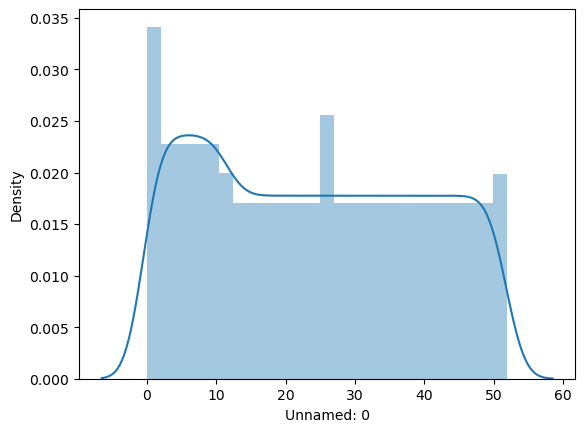

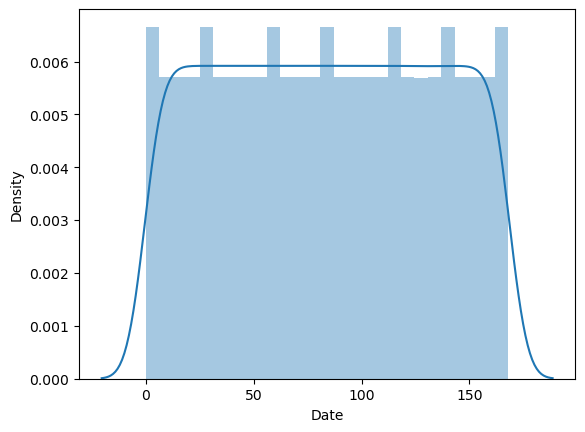

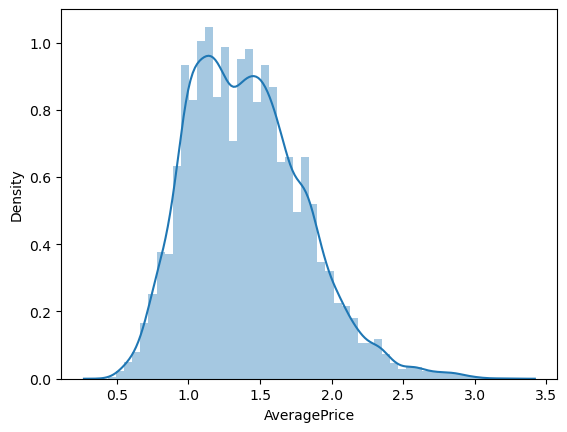

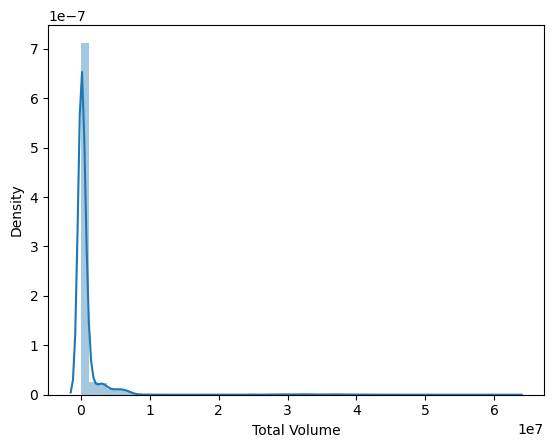

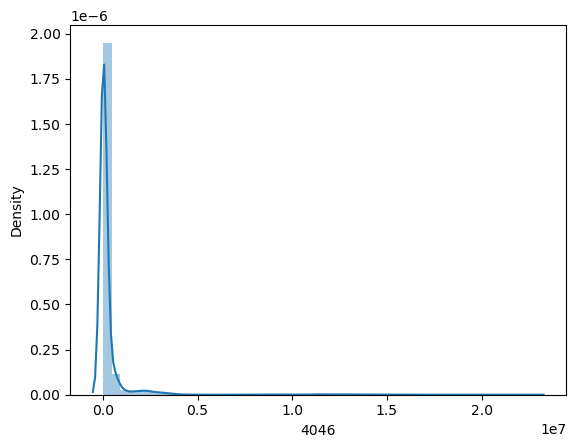

...

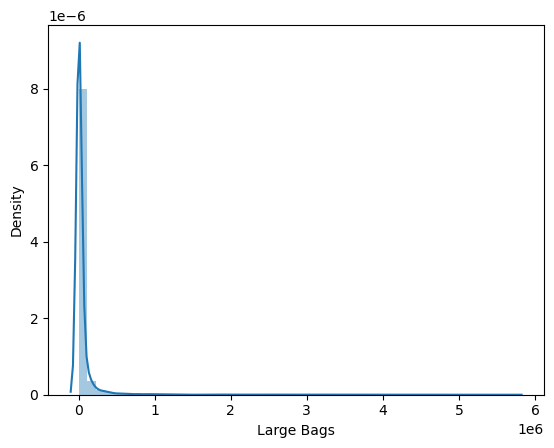

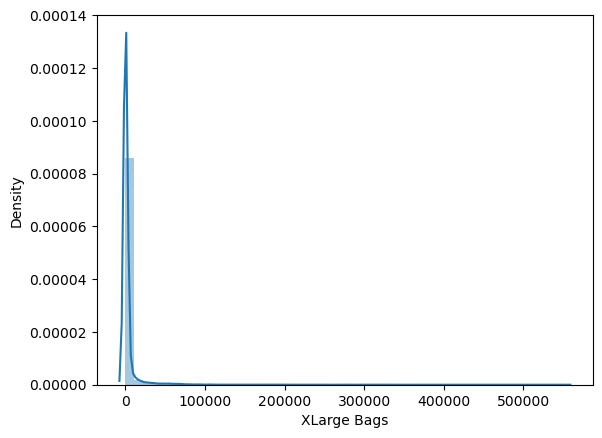

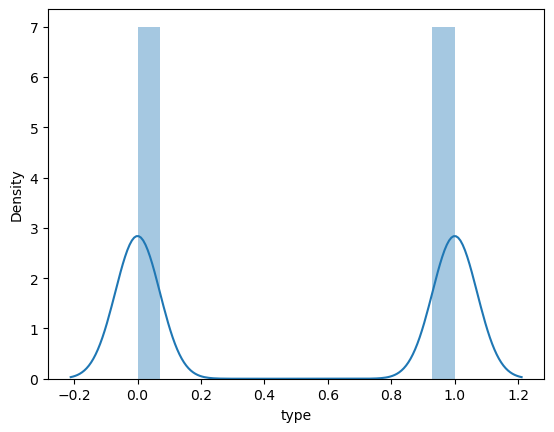

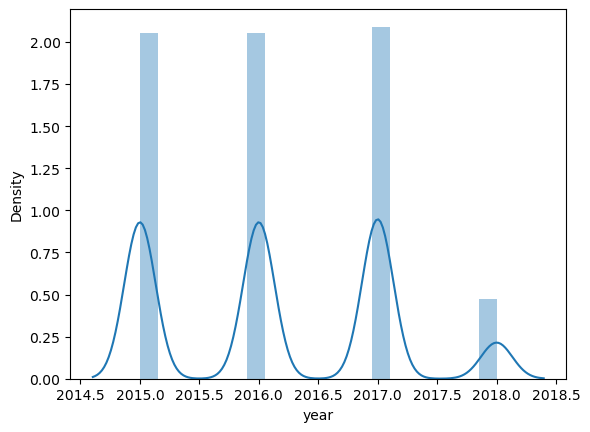

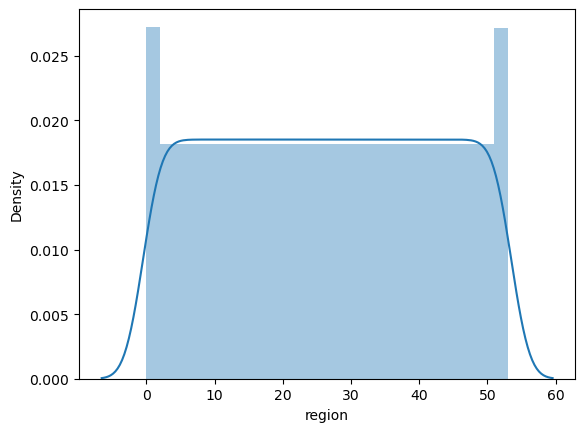

In [68]:
for i in df.columns: # Skewness
    plt.figure()
    sns.distplot(df[i])

In [109]:
x= ['Total Volume', '4046','4225', '4770', 'Total Bags','Small Bags','Large Bags','XLarge Bags']
for i in x:
    df[i]=np.cbrt(df[i])
df.skew()

Unnamed: 0      0.108334
Date            0.000117
AveragePrice    0.580303
Total Volume    2.236143
4046            2.277861
4225            2.130378
4770            2.316048
Total Bags      2.302176
Small Bags      2.217682
Large Bags      2.186514
XLarge Bags     2.842255
type            0.000329
year            0.215339
region          0.000030
dtype: float64

Unnamed: 0         Axes(0.125,0.825775;0.168478x0.0542254)
Date            Axes(0.327174,0.825775;0.168478x0.0542254)
AveragePrice    Axes(0.529348,0.825775;0.168478x0.0542254)
Total Volume    Axes(0.731522,0.825775;0.168478x0.0542254)
4046               Axes(0.125,0.760704;0.168478x0.0542254)
4225            Axes(0.327174,0.760704;0.168478x0.0542254)
4770            Axes(0.529348,0.760704;0.168478x0.0542254)
Total Bags      Axes(0.731522,0.760704;0.168478x0.0542254)
Small Bags         Axes(0.125,0.695634;0.168478x0.0542254)
Large Bags      Axes(0.327174,0.695634;0.168478x0.0542254)
XLarge Bags     Axes(0.529348,0.695634;0.168478x0.0542254)
type            Axes(0.731522,0.695634;0.168478x0.0542254)
year               Axes(0.125,0.630563;0.168478x0.0542254)
region          Axes(0.327174,0.630563;0.168478x0.0542254)
dtype: object

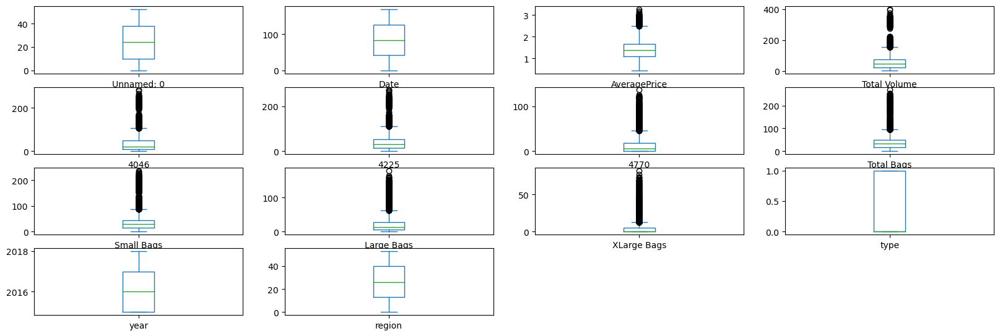

In [110]:
df.plot(kind='box',subplots=True,layout=(12,4),figsize=(20,20))

## Note 3: Observations: 
- Skewness observed in 'Total Volume', '4046','4225', '4770', 'Total Bags','Small Bags','Large Bags','XLarge Bags'
- XLarge Bags, 4770, Small Bags,Large Bags, Total Bags, Average Price,Total Volume,4046,4225 has major outliares. 


In [111]:
from scipy.stats import zscore
ol = ['AveragePrice', 'Total Volume','4046', '4225', '4770', 'Total Bags','Small Bags','Large Bags','XLarge Bags']
for i in ol:
    col = df[i]
    z=zscore(col)
    thresh =3
    df1 = df[(z < thresh) & (z > -thresh)]

print("Data loss rate",((df.shape[0]-df1.shape[0])/df.shape[0])*100)

Data loss rate 2.6138418543481836


## Note 4: Data frame changed to DF1

# Project1: Region : Classification Model

# 4. Co- Relation and Multicolinearity [Dataframe changed to DF2 for Region model]

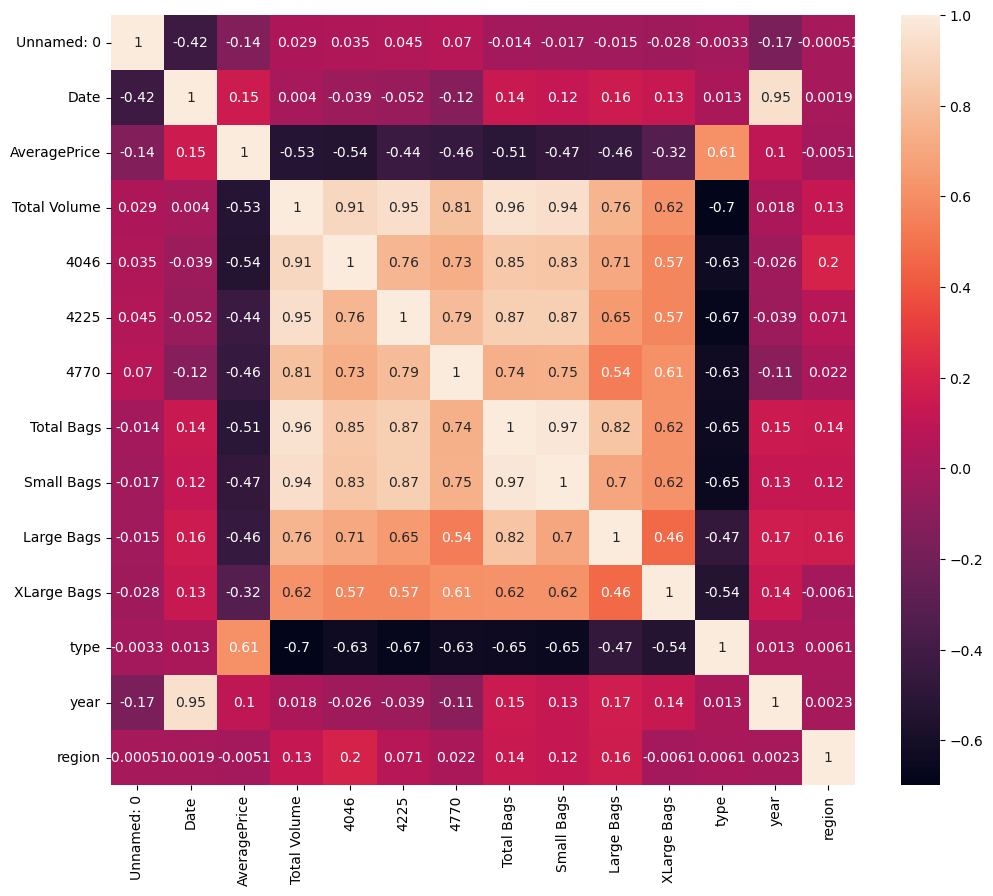

In [112]:
df2 = df1
corr_hmap=df2.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr_hmap,annot=True)
plt.show()

## Note 5: Observations: 
- V Low Co-relations - All the rows have very low relationw ith output

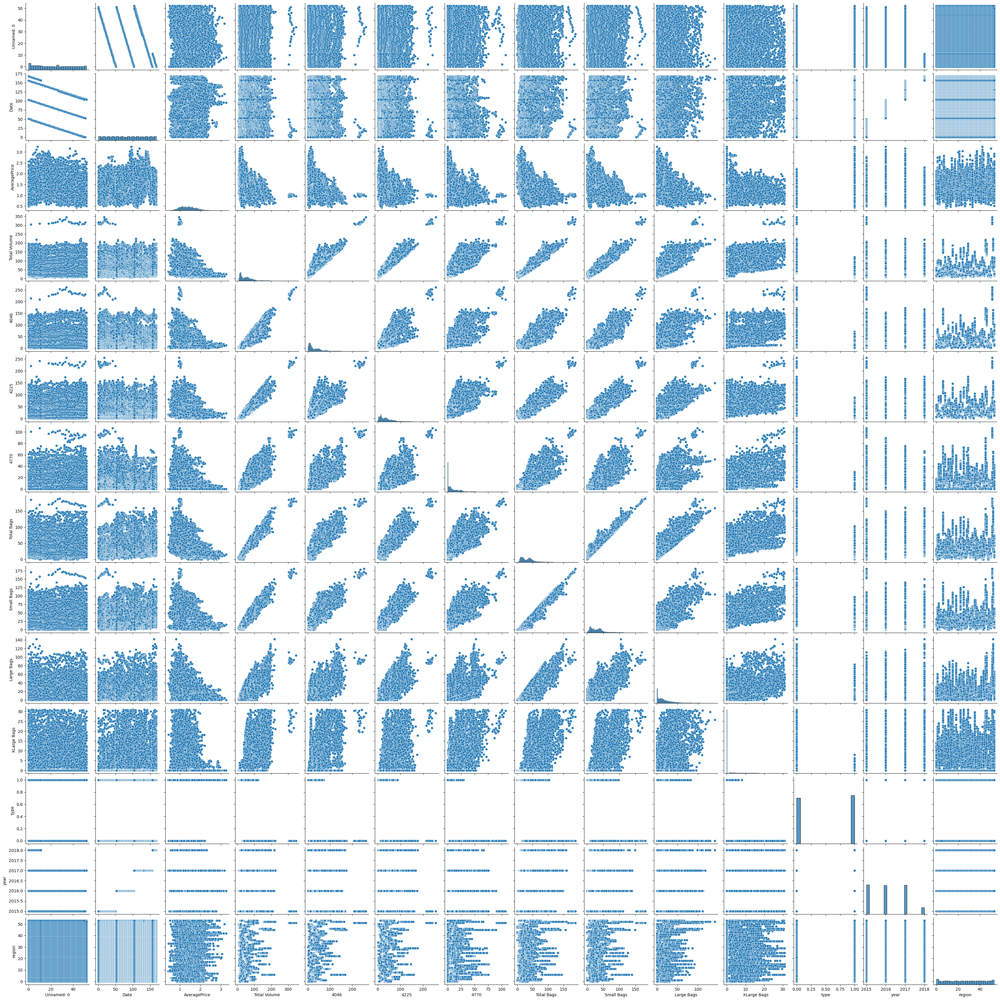

In [31]:
sns.pairplot(df2)

In [113]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x=df2.iloc[:,0:-1]
x
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

    VIF Factor      features
0     4.259868    Unnamed: 0
1     6.498324          Date
2    27.602705  AveragePrice
3   629.268743  Total Volume
4    52.955623          4046
5   114.564836          4225
6     5.611203          4770
7   410.565409    Total Bags
8   205.275019    Small Bags
9    22.480214    Large Bags
10    2.468083   XLarge Bags
11    5.427592          type
12   42.517742          year


In [114]:
columns_to_drop=["Total Volume","Total Bags"]
df2 = df2.drop(columns_to_drop, axis=1)

In [115]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x=df2.iloc[:,0:-1]
x
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

    VIF Factor      features
0     4.254925    Unnamed: 0
1     6.412935          Date
2    25.503735  AveragePrice
3     8.851614          4046
4    15.193944          4225
5     5.546671          4770
6    20.112777    Small Bags
7     5.017285    Large Bags
8     2.447109   XLarge Bags
9     5.399595          type
10   36.074455          year


# MODEL

## 1. Feature Scaling using Standard Scalarization

In [116]:
# to remove biasness. Standard Scaler consider Zero as mean and 1 as std dev value
x=df2.iloc[:,0:-1]
y=df2.iloc[:,-1]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

## 2. OverSampling

In [117]:
import imblearn
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1,y1=SM.fit_resample(x,y)

In [80]:
y1.value_counts()

region
0.0     338
40.0    338
29.0    338
30.0    338
31.0    338
32.0    338
33.0    338
34.0    338
35.0    338
36.0    338
37.0    338
38.0    338
39.0    338
41.0    338
1.0     338
42.0    338
43.0    338
44.0    338
45.0    338
46.0    338
47.0    338
48.0    338
49.0    338
50.0    338
51.0    338
52.0    338
28.0    338
27.0    338
26.0    338
25.0    338
2.0     338
3.0     338
4.0     338
5.0     338
6.0     338
7.0     338
8.0     338
9.0     338
10.0    338
11.0    338
12.0    338
13.0    338
14.0    338
15.0    338
16.0    338
17.0    338
18.0    338
19.0    338
20.0    338
21.0    338
22.0    338
23.0    338
24.0    338
53.0    338
Name: count, dtype: int64

## 3. Best random state value:

In [81]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score



maxAccu=0
maxRS=0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train,y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc > maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," at random state ", maxRS)

Best accuracy is 0.9338933528122717  at random state  175


## 4. Creating train test split

In [118]:
maxRS = 175

In [119]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x1,y1,test_size=0.30,random_state=maxRS)

## 5. Classification Algorithms and Cross Validation Score

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
rfc=RandomForestClassifier()
etc=ExtraTreesClassifier()
lg=LogisticRegression()
svc=SVC(kernel = "linear")
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
bc=BaggingClassifier()
gnb=GaussianNB()
knn = KNeighborsClassifier(n_neighbors=5)
dtc = DecisionTreeClassifier(criterion = "gini")



model=[rfc,etc,lg,svc,gbc,abc,bc,gnb,knn,dtc]

for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy Score of:  ",m," is " )
    print(accuracy_score(y_test,predm))
    print(confusion_matrix(y_test,predm))
    print(classification_report(y_test,predm))
    print("\n")
    score = cross_val_score(m,x1,y1)
    print("Cross Validation of:  ",m," is " )
    print(score)
    print(score.mean())
    print("Diff in Acc Score and Cross Val Score is - ",accuracy_score(y_test,predm)-score.mean())
    print("\n")

Accuracy Score of:   RandomForestClassifier()  is 
0.9293279766252739
[[ 93   0   0 ...   0   0   0]
 [  0 102   0 ...   0   0   0]
 [  0   0  82 ...   0   0   0]
 ...
 [  0   0   0 ...  88   0   0]
 [  0   0   0 ...   0 102   0]
 [  0   0   2 ...   0   0  75]]
              precision    recall  f1-score   support

         0.0       0.94      0.89      0.92       104
         1.0       0.93      0.90      0.91       113
         2.0       0.93      0.96      0.95        85
         3.0       0.89      0.87      0.88        95
         4.0       0.95      0.96      0.96       111
         5.0       0.93      0.88      0.90       102
         6.0       0.99      0.99      0.99       112
         7.0       0.92      0.94      0.93        97
         8.0       0.96      1.00      0.98        96
         9.0       0.91      0.95      0.93       113
        10.0       0.91      0.83      0.87       101
        11.0       0.97      0.96      0.97       105
        12.0       0.95      0.99  

Cross Validation of:   LogisticRegression()  is 
[0.50643659 0.48123802 0.44       0.28739726 0.25726027]
0.39446642878850985
Diff in Acc Score and Cross Val Score is -  0.10571618625897011


Accuracy Score of:   SVC(kernel='linear')  is 
0.6681884587289992
[[ 87   0   0 ...   0   0   0]
 [  0  60   0 ...   0   0   0]
 [  0   0  75 ...   0   0   0]
 ...
 [  0   0   0 ...  88   0   0]
 [  0   0   0 ...   0 100   0]
 [  0   7   3 ...   0   0  32]]
              precision    recall  f1-score   support

         0.0       0.51      0.84      0.64       104
         1.0       0.31      0.53      0.39       113
         2.0       0.89      0.88      0.89        85
         3.0       0.69      0.52      0.59        95
         4.0       0.80      0.69      0.74       111
         5.0       0.70      0.66      0.68       102
         6.0       0.86      0.96      0.91       112
         7.0       0.66      0.79      0.72        97
         8.0       0.88      0.97      0.92        96
         

Cross Validation of:   AdaBoostClassifier()  is 
[0.03314161 0.03095042 0.08027397 0.10273973 0.05534247]
0.06048963879289967
Diff in Acc Score and Cross Val Score is -  0.012556380199065263


Accuracy Score of:   BaggingClassifier()  is 
0.8701607012417824
[[87  0  0 ...  0  0  0]
 [ 0 88  0 ...  0  0  0]
 [ 0  0 82 ...  0  0  0]
 ...
 [ 0  0  0 ... 88  0  0]
 [ 0  0  0 ...  0 99  0]
 [ 0  0  3 ...  0  0 64]]
              precision    recall  f1-score   support

         0.0       0.86      0.84      0.85       104
         1.0       0.85      0.78      0.81       113
         2.0       0.85      0.96      0.91        85
         3.0       0.86      0.86      0.86        95
         4.0       0.92      0.93      0.92       111
         5.0       0.86      0.83      0.85       102
         6.0       0.95      0.95      0.95       112
         7.0       0.84      0.91      0.87        97
         8.0       0.91      0.98      0.94        96
         9.0       0.86      0.95      0.90  

### Best Model is : RandomForestClassifier

### 6. Hyper Parameter Tuning

In [120]:
from sklearn.model_selection import GridSearchCV
parameters = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [121]:
GCV = GridSearchCV(RandomForestClassifier(),parameters,cv=5)

In [122]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False],
                         'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 150]})

In [123]:
GCV.best_params_

{'bootstrap': False,
 'max_depth': 30,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 150}

In [124]:
RFC_final = RandomForestClassifier(
  bootstrap =  False,
  max_depth = 30,
  min_samples_leaf = 1,
  min_samples_split =  2,
  n_estimators =  150,
  random_state=maxRS )
RFC_final.fit(x_train,y_train)
pred=RFC_final.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

93.57195032870709


## 7. Saving the Model

In [125]:
import joblib # save as *.pkl
joblib.dump(RFC_final,"Avacado_Region.pkl")

['Avacado_Region.pkl']

# Project2: average price : Regression Model

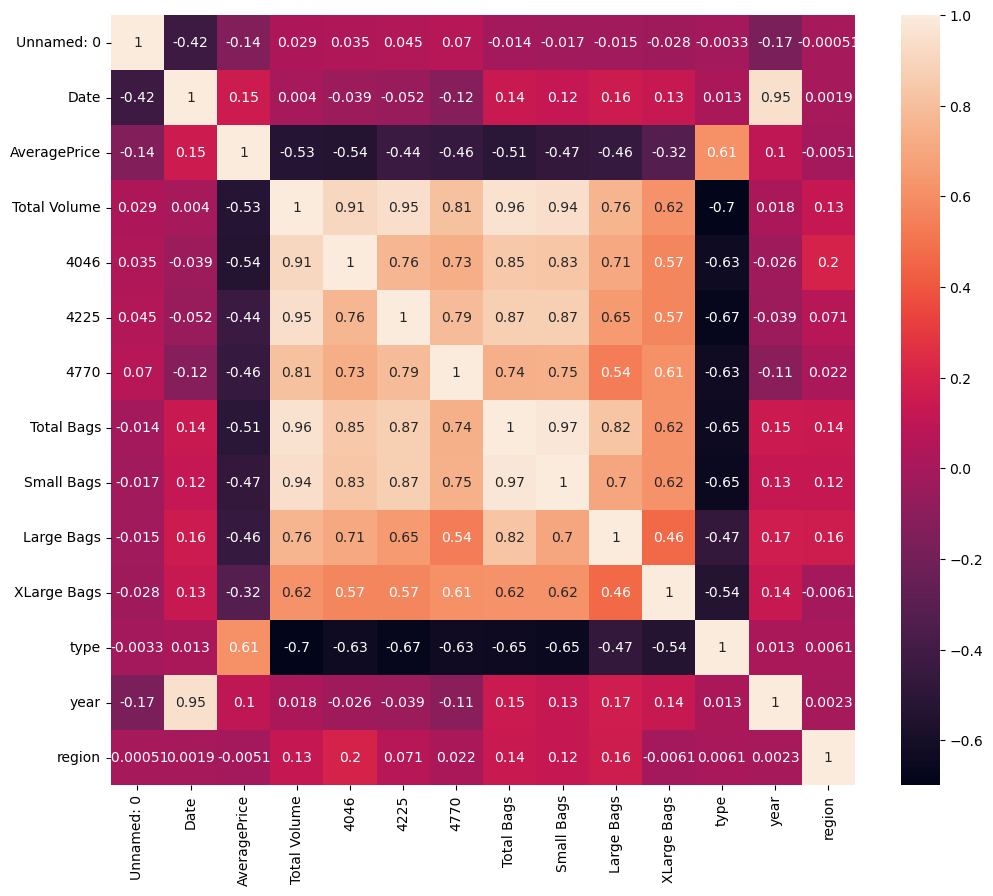

In [126]:
corr_hmap=df1.corr()
plt.figure(figsize=(12,10))
sns.heatmap(corr_hmap,annot=True)
plt.show()

## Note 5: Observations: 
- V Low Co-relations Near to Zero :  Region, Year, Date
- Low Co-relation    0.3 or >-0.3 --> Small, Large, Xlarge, 4770
- Mod Co-relation    0.5 or >-0.5 --> Type , Total, 4046 , Total Vol
- Hig Co-relation    0.7 or >-0.7 --> 

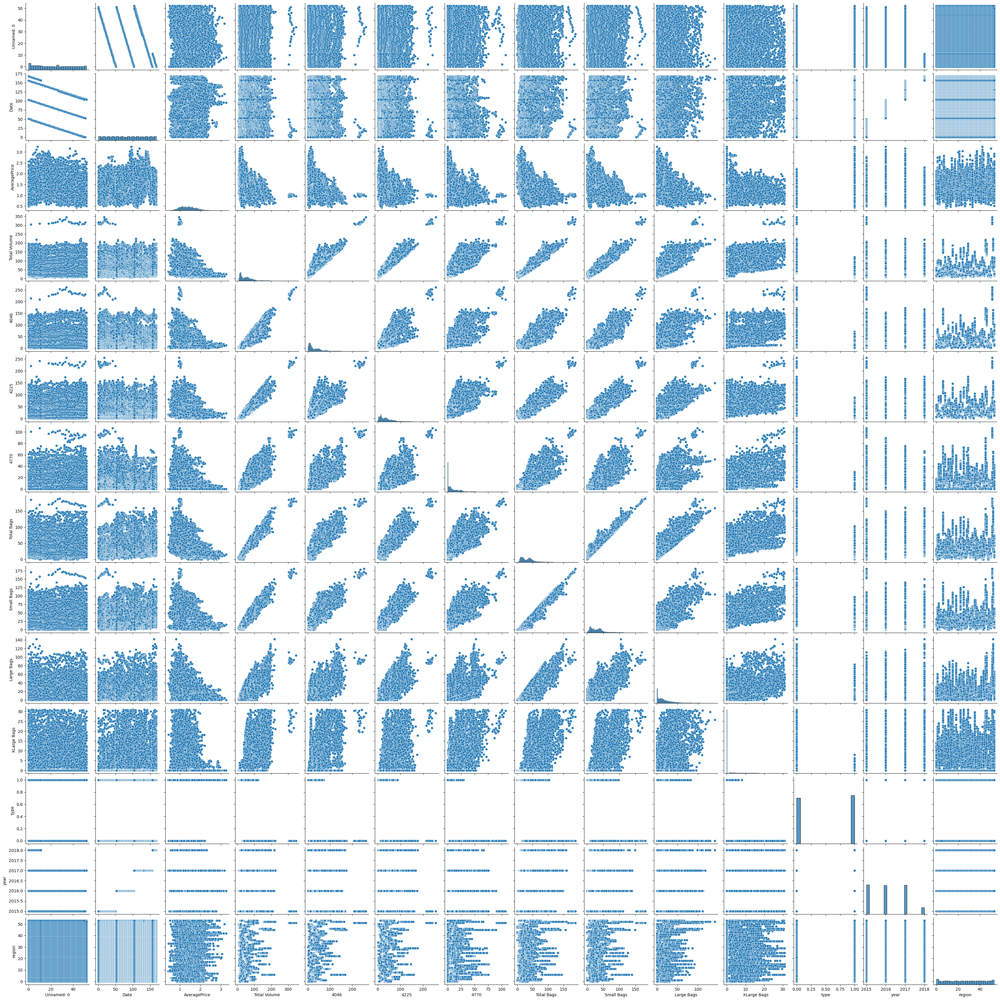

In [127]:
sns.pairplot(df1)

In [129]:
df1.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

In [131]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x_x = ['Unnamed: 0', 'Date', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region']
x = df1[x_x]
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

    VIF Factor      features
0     4.231359    Unnamed: 0
1     6.243757          Date
2   627.658837  Total Volume
3    55.072300          4046
4   109.970638          4225
5     5.639211          4770
6   402.604291    Total Bags
7   197.483129    Small Bags
8    22.299167    Large Bags
9     2.469638   XLarge Bags
10    4.333413          type
11   23.298925          year
12    4.410759        region


In [133]:
columns_to_drop=["Total Volume"] 
df2 = df1.drop(columns_to_drop, axis=1)
df2

,Unnamed: 0,Date,AveragePrice,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,51.0,1.33,10.120997,37.903460,3.638275,20.564634,20.490870,4.534711,0.0,0.0,2015,0.0
1,1,50.0,1.35,8.768933,35.473513,3.878204,21.183249,21.110581,4.602425,0.0,0.0,2015,0.0
2,2,49.0,0.93,9.262632,47.790416,5.072283,20.120399,20.035113,4.689671,0.0,0.0,2015,0.0
3,3,48.0,1.08,10.421946,41.597133,4.171309,17.978534,17.839520,5.114173,0.0,0.0,2015,0.0
4,4,47.0,1.28,9.800999,35.260208,4.231732,18.355039,18.157325,5.825433,0.0,0.0,2015,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,161.0,1.63,12.697058,11.520945,0.000000,23.810234,23.553564,7.558651,0.0,1.0,2018,53.0
18245,8,160.0,1.71,10.602029,15.083241,0.000000,21.002902,20.754542,6.873934,0.0,1.0,2018,53.0
18246,9,159.0,1.87,10.602681,13.486113,8.995636,21.100134,21.068409,3.484558,0.0,1.0,2018,53.0
18247,10,158.0,1.93,11.517001,14.392048,8.991803,22.219254,22.185443,3.684031,0.0,1.0,2018,53.0


In [135]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
x_x = ['Unnamed: 0', 'Date', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region']
x = df2[x_x]
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["features"]=x.columns
    print(vif)
vif_cal()

    VIF Factor     features
0     4.230274   Unnamed: 0
1     6.239151         Date
2     9.127072         4046
3    15.004811         4225
4     5.585993         4770
5   341.819893   Total Bags
6   197.210173   Small Bags
7    22.298331   Large Bags
8     2.456499  XLarge Bags
9     4.302764         type
10   21.582397         year
11    4.302018       region


In [136]:
columns_to_drop=["Total Bags"] 
df2 = df2.drop(columns_to_drop, axis=1)

# MODEL

### 1. Feature Scaling using Standard Scalarization

In [138]:
# to remove biasness. Standard Scaler consider Zero as mean and 1 as std dev value
y=df1["AveragePrice"]
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)


### 2. Best random state value:

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor



maxAccu=0
maxRS=0
for i in range (1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=i)
    lr = LinearRegression()
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    acc = r2_score(y_test,pred)
    if acc > maxAccu:
        maxAccu = acc
        maxRS=i
print("Best accuracy is", maxAccu," at random state ", maxRS)

Best accuracy is 0.5455113354780039  at random state  79


### 3. Creating train test split

In [140]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.30,random_state=maxRS)

### 4. Regression Algorithms and Cross Validation Score

R2_score:   LinearRegression()  is  0.5455113354780039
R2_score_Training Data:   LinearRegression()  is  51.98019899195595
error:
Mean Absolute error 0.2133292945224293
Mean Squared error 0.07547794893828766
Root Mean Squared error 0.27473250433519447


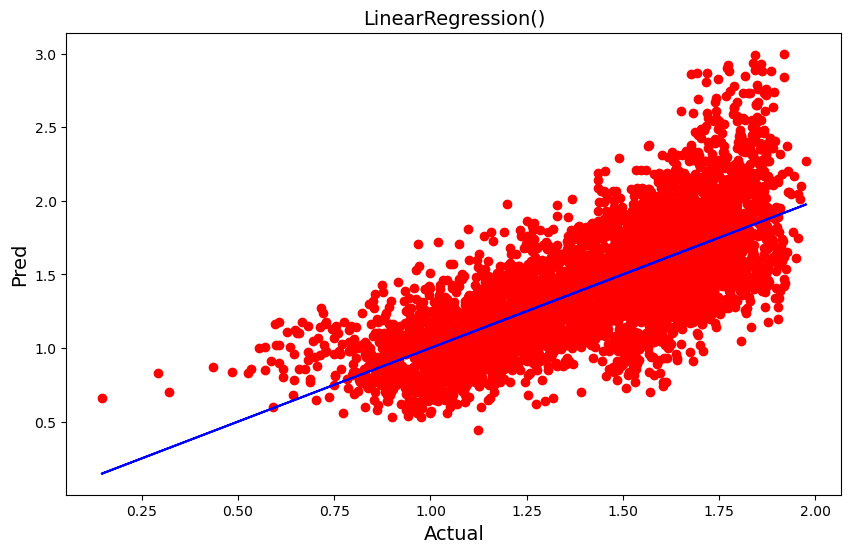

Cross Validation of:   LinearRegression()  is 
[-0.31106017  0.37366472  0.35997136  0.15768039  0.1950575 ]
0.15506275921048354
Diff in Acc Score and Cross Val Score is -  39.04485762675204


R2_score:   RandomForestRegressor()  is  0.9100053280424159
R2_score_Training Data:   RandomForestRegressor()  is  98.57412923107246
error:
Mean Absolute error 0.08569628657164291
Mean Squared error 0.01494561643660915
Root Mean Squared error 0.12225226556841043


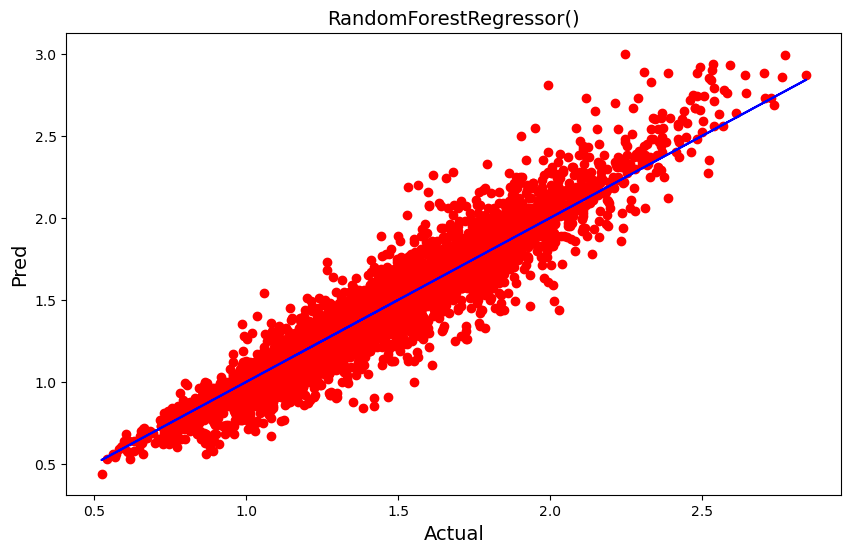

Cross Validation of:   RandomForestRegressor()  is 
[0.33304219 0.64641448 0.66272459 0.3676013  0.06670979]
0.41529847026511213
Diff in Acc Score and Cross Val Score is -  49.470685777730374


R2_score:   DecisionTreeRegressor()  is  0.804775885313576
R2_score_Training Data:   DecisionTreeRegressor()  is  100.0
error:
Mean Absolute error 0.11756189047261816
Mean Squared error 0.032421305326331584
Root Mean Squared error 0.1800591717362145


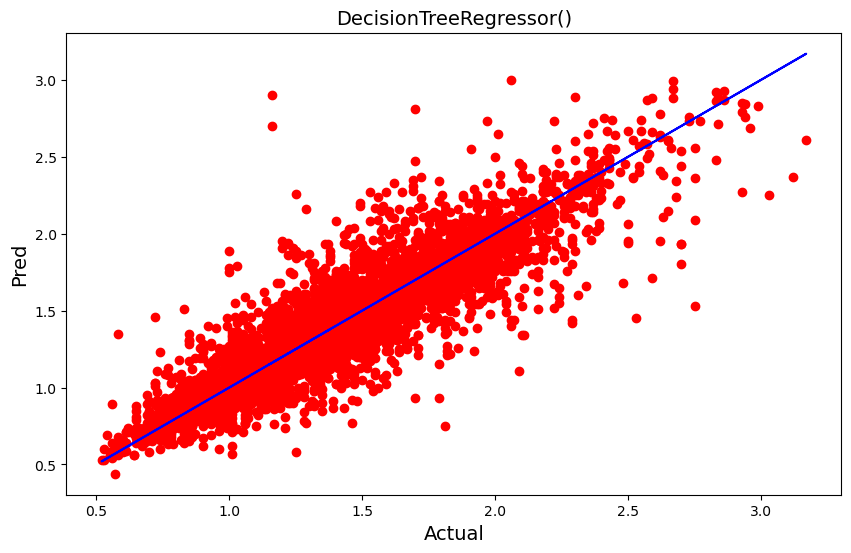

Cross Validation of:   DecisionTreeRegressor()  is 
[-1.10982555  0.32047848  0.29457395 -0.36893002 -0.70882915]
-0.3145064579531363
Diff in Acc Score and Cross Val Score is -  111.92823432667123


R2_score:   KNeighborsRegressor()  is  0.8823650168807484
R2_score_Training Data:   KNeighborsRegressor()  is  92.29179222029215
error:
Mean Absolute error 0.09801612903225808
Mean Squared error 0.019535904726181542
Root Mean Squared error 0.13977090085629965


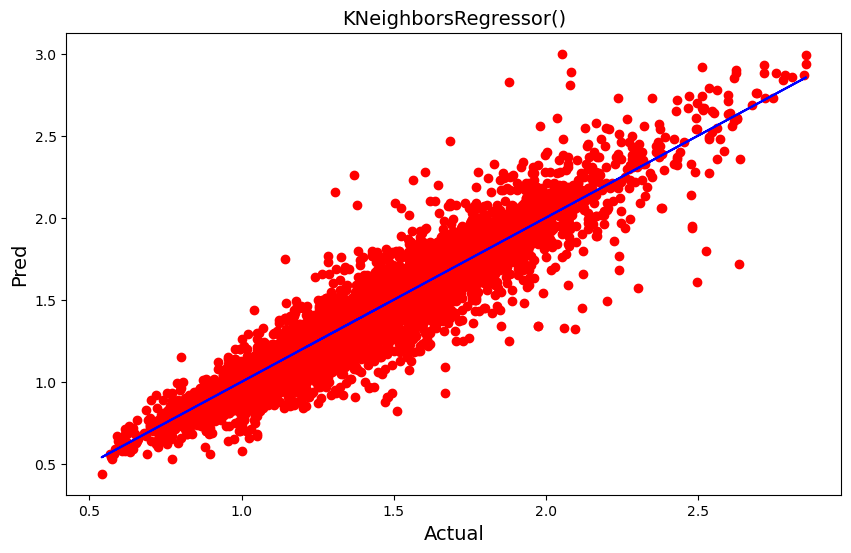

Cross Validation of:   KNeighborsRegressor()  is 
[-0.48056235  0.25414409  0.39168487 -0.09537644 -0.03828141]
0.006321753563707966
Diff in Acc Score and Cross Val Score is -  87.60432633170404


R2_score:   Lasso()  is  -0.00037020726989922537
R2_score_Training Data:   Lasso()  is  0.0
error:
Mean Absolute error 0.3298761587502985
Mean Squared error 0.16613371755512155
Root Mean Squared error 0.4075950411316624


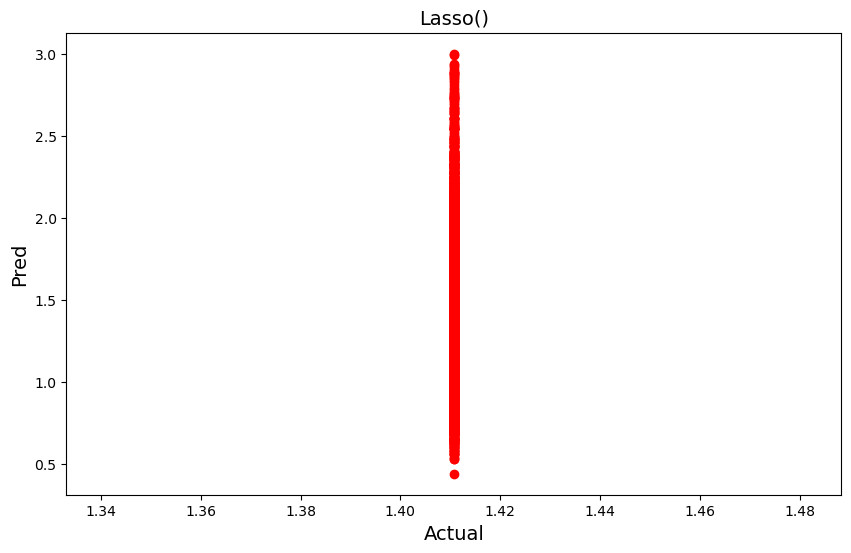

Cross Validation of:   Lasso()  is 
[-4.05107105 -0.76266836 -0.0499364  -0.39760078 -0.79768832]
-1.2117929822029772
Diff in Acc Score and Cross Val Score is -  121.14227749330779


R2_score:   Ridge()  is  0.5455138016798229
R2_score_Training Data:   Ridge()  is  51.979619602934555
error:
Mean Absolute error 0.21331412244208756
Mean Squared error 0.07547753937063613
Root Mean Squared error 0.27473175894067314


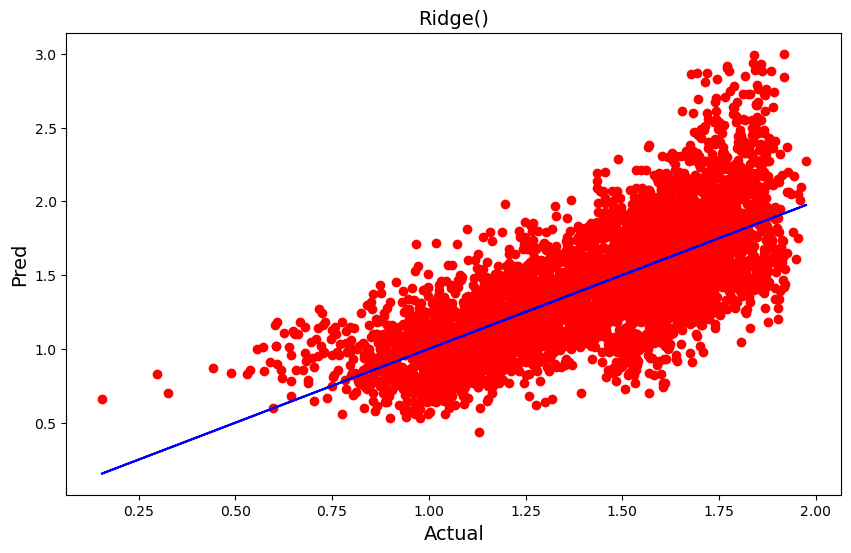

Cross Validation of:   Ridge()  is 
[-0.30929223  0.37326453  0.36047685  0.1572633   0.19450963]
0.15524441605144107
Diff in Acc Score and Cross Val Score is -  39.02693856283818


R2_score:   SVR()  is  0.7809308998947266
R2_score_Training Data:   SVR()  is  77.47511066525465
error:
Mean Absolute error 0.1375626462453513
Mean Squared error 0.03638129538190539
Root Mean Squared error 0.19073881456563946


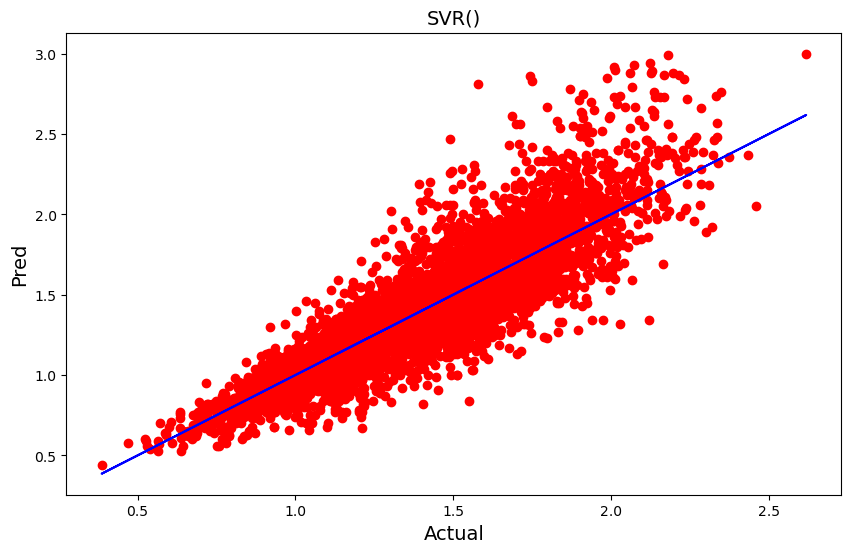

Cross Validation of:   SVR()  is 
[-0.45284022  0.40685882 -0.12992401  0.34472673  0.02036115]
0.0378364930408269
Diff in Acc Score and Cross Val Score is -  74.30944068538997


R2_score:   ExtraTreesRegressor()  is  0.9251399471773322
R2_score_Training Data:   ExtraTreesRegressor()  is  100.0
error:
Mean Absolute error 0.07667008627156789
Mean Squared error 0.012432176389722433
Root Mean Squared error 0.1114996699085806


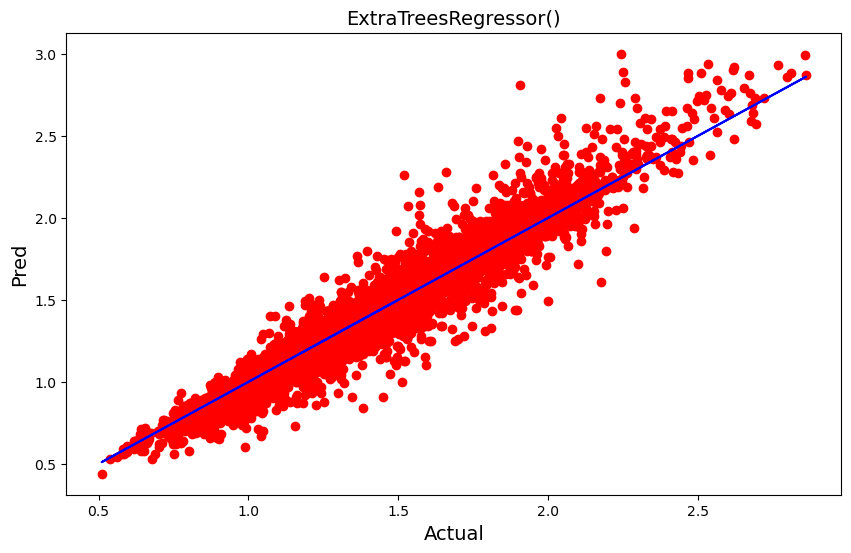

Cross Validation of:   ExtraTreesRegressor()  is 
[0.42609402 0.59012668 0.67211197 0.4117807  0.15625703]
0.45127408055908325
Diff in Acc Score and Cross Val Score is -  47.38658666182489




In [141]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.svm import SVR
from sklearn.model_selection import cross_val_score
#from sklearn.svm import SVC
#from sklearn.ensemble import GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
#from sklearn.naive_bayes import MultinomialNB
#from sklearn.naive_bayes import GaussianNB


lr= LinearRegression()
rfc=RandomForestRegressor()
dtr=DecisionTreeRegressor()
kn=KNN()
ls=Lasso()
rd=Ridge()
svr=SVR()
etr=ExtraTreesRegressor()




model=[lr,rfc,dtr,kn,ls,rd,svr,etr]

for m in model:
    m.fit(x_train,y_train)
    predm=m.predict(x_test)
    pred_train=m.predict(x_train)
    
    print("R2_score:  ",m," is " ,r2_score(y_test,predm))
    print("R2_score_Training Data:  ",m," is " ,r2_score(y_train,pred_train)*100)
    print("error:")
    
    print("Mean Absolute error",mean_absolute_error(y_test,predm))
    print("Mean Squared error",mean_squared_error(y_test,predm))
    print("Root Mean Squared error",np.sqrt(mean_squared_error(y_test,predm)))
   
    plt.figure(figsize=(10,6))
    plt.scatter(x=predm,y=y_test,color="r")
    plt.plot(predm,predm,color="b")
    plt.xlabel("Actual",fontsize=14)
    plt.ylabel("Pred",fontsize=14)
    plt.title(m,fontsize=14)
    plt.show()
    score = cross_val_score(m,x,y)
    print("Cross Validation of:  ",m," is " )
    print(score)
    print(score.mean())
    print("Diff in Acc Score and Cross Val Score is - ",(r2_score(y_test,predm)-score.mean())*100)
    print("\n")

### ExtraTreesRegressor is the best model with least error

### 5. Hyper Parameter Tuning

In [142]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Instantiate GridSearchCV without "precomputed" kernel
GCV = GridSearchCV(ExtraTreesRegressor(),parameters, cv=5)
GCV.fit(x_train, y_train)
print(GCV.best_params_)

{'bootstrap': False, 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 150}


In [143]:
Final_model = ExtraTreesRegressor(bootstrap = False, max_depth = None, min_samples_leaf = 1, min_samples_split = 2, n_estimators = 150)
Final_model.fit(x_train,y_train)
pred=Final_model.predict(x_test)
acc=r2_score(y_test,pred)
print(acc*100)

print("R2_score:",r2_score(y_test,pred))

print("Mean Absolute error",mean_absolute_error(y_test,pred))
print("Mean Squared error",mean_squared_error(y_test,pred))
print("Root Mean Squared error",np.sqrt(mean_squared_error(y_test,pred)))

92.63324816026675
R2_score: 0.9263324816026675
Mean Absolute error 0.07603035758939737
Mean Squared error 0.012234129530716014
Root Mean Squared error 0.11060799939749391


# Saving the Model

In [145]:
import joblib # save as *.pkl
joblib.dump(Final_model,"Avacado_AvgPrice.pkl")

['Avacado_AvgPrice.pkl']